# Obesity Risk Prediction

Objective:- 
Predict the obesity risk (NObeyesdad) of individuals based on various features such as demographic information, lifestyle choices, and health-related metrics. This prediction can aid in assessing the risk of cardiovascular diseases associated with obesity.

In [1]:
#Import Library 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from scipy import stats

In [2]:
#This file contains the features and the target variable (NObeyesdad) that you will use to train your model.
data = pd.read_csv('train (1).csv') 
#This file contains the features for which you want to make predictions.
test_data = pd.read_csv('test.csv')
#

# Basic Checks 

In [3]:
data.head()

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


In [4]:
data.tail()

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
20753,20753,Male,25.137087,1.766626,114.187096,yes,yes,2.919584,3.000000,Sometimes,no,2.151809,no,1.330519,0.196680,Sometimes,Public_Transportation,Obesity_Type_II
20754,20754,Male,18.000000,1.710000,50.000000,no,yes,3.000000,4.000000,Frequently,no,1.000000,no,2.000000,1.000000,Sometimes,Public_Transportation,Insufficient_Weight
20755,20755,Male,20.101026,1.819557,105.580491,yes,yes,2.407817,3.000000,Sometimes,no,2.000000,no,1.158040,1.198439,no,Public_Transportation,Obesity_Type_II
20756,20756,Male,33.852953,1.700000,83.520113,yes,yes,2.671238,1.971472,Sometimes,no,2.144838,no,0.000000,0.973834,no,Automobile,Overweight_Level_II
20757,20757,Male,26.680376,1.816547,118.134898,yes,yes,3.000000,3.000000,Sometimes,no,2.003563,no,0.684487,0.713823,Sometimes,Public_Transportation,Obesity_Type_II


In [5]:
data.sample() #Displays a random sample from the dataset.

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
17638,17638,Male,21.051107,1.65,105.580491,yes,yes,2.630137,3.0,Sometimes,no,1.0,no,0.578074,0.0,Sometimes,Public_Transportation,Obesity_Type_II


In [6]:
data.columns

Index(['id', 'Gender', 'Age', 'Height', 'Weight',
       'family_history_with_overweight', 'FAVC', 'FCVC', 'NCP', 'CAEC',
       'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

In [7]:
data.dtypes  #Checking data types 

id                                  int64
Gender                             object
Age                               float64
Height                            float64
Weight                            float64
family_history_with_overweight     object
FAVC                               object
FCVC                              float64
NCP                               float64
CAEC                               object
SMOKE                              object
CH2O                              float64
SCC                                object
FAF                               float64
TUE                               float64
CALC                               object
MTRANS                             object
NObeyesdad                         object
dtype: object

In [8]:
data.shape  #Returns the number of rows and columns (e.g., (rows, columns)).

(20758, 18)

In [9]:
test_data.shape

(13840, 17)

In [10]:
data.size  #Returns the total number of elements in the dataset.


373644

In [11]:
data['NObeyesdad'].value_counts()  #Target Feature 

Obesity_Type_III       4046
Obesity_Type_II        3248
Normal_Weight          3082
Obesity_Type_I         2910
Insufficient_Weight    2523
Overweight_Level_II    2522
Overweight_Level_I     2427
Name: NObeyesdad, dtype: int64

NObeyesdad :No obesity based on exercise and diet.

Hence, this is the Target Feature which has many labels. This is a Multiclass Classification Problem 

In [12]:
data['CAEC'].value_counts()  #Consumption of food between meals (snacking contribution)

Sometimes     17529
Frequently     2472
Always          478
no              279
Name: CAEC, dtype: int64

In [13]:
smallest_age = data['Age'].min()
largest_age = data['Age'].max()
print(smallest_age)
print(largest_age)


14.0
61.0


In [63]:
# List of categorical columns
categorical_columns = ['Gender', 'Age','family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS']


# Check for Duplicate Rows

In [15]:
data.duplicated().sum() # Returns the number of duplicate rows.

0

# Display Index Information

In [16]:
data.index   #Shows the row index range.


RangeIndex(start=0, stop=20758, step=1)

The index starts at 0, the index stops before 20758 and The last index in the DataFrame is 20757, indicating there are 20,758 rows in total.

# Statistical Analysis 

In [17]:
data.info()   #a concise summary of the dataset, including the number of non-null values, data types, and memory usage.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20758 non-null  int64  
 1   Gender                          20758 non-null  object 
 2   Age                             20758 non-null  float64
 3   Height                          20758 non-null  float64
 4   Weight                          20758 non-null  float64
 5   family_history_with_overweight  20758 non-null  object 
 6   FAVC                            20758 non-null  object 
 7   FCVC                            20758 non-null  float64
 8   NCP                             20758 non-null  float64
 9   CAEC                            20758 non-null  object 
 10  SMOKE                           20758 non-null  object 
 11  CH2O                            20758 non-null  float64
 12  SCC                             

In [18]:
data.describe()

,id,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
count,20758.00000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000
mean,10378.50000,23.841804,1.700245,87.887768,2.445908,2.761332,2.029418,0.981747,0.616756
std,5992.46278,5.688072,0.087312,26.379443,0.533218,0.705375,0.608467,0.838302,0.602113
min,0.00000,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,5189.25000,20.000000,1.631856,66.000000,2.000000,3.000000,1.792022,0.008013,0.000000
50%,10378.50000,22.815416,1.700000,84.064875,2.393837,3.000000,2.000000,1.000000,0.573887
75%,15567.75000,26.000000,1.762887,111.600553,3.000000,3.000000,2.549617,1.587406,1.000000
max,20757.00000,61.000000,1.975663,165.057269,3.000000,4.000000,3.000000,3.000000,2.000000


In [19]:
data.describe(include = 'O')  #For categorical value 

,Gender,family_history_with_overweight,FAVC,CAEC,SMOKE,SCC,CALC,MTRANS,NObeyesdad
count,20758,20758,20758,20758,20758,20758,20758,20758,20758
unique,2,2,2,4,2,2,3,5,7
top,Female,yes,yes,Sometimes,no,no,Sometimes,Public_Transportation,Obesity_Type_III
freq,10422,17014,18982,17529,20513,20071,15066,16687,4046


In [20]:
def summary(data):
    print(f'Data Shape:-{data.shape}')
    sum = pd.DataFrame(data.dtypes, columns=['Data Type'])
    sum["Missing values"] = data.isnull().sum().values
    sum["Missing %"] = data.isnull().sum().values/len(data)*100
    sum["Unique values"] = data.nunique().values
    desc = pd.DataFrame(data.describe(include='all').transpose())
    sum['min'] = desc['min'].values
    sum['max'] = desc['max'].values
    return sum
summary(data)

Data Shape:-(20758, 18)


,Data Type,Missing values,Missing %,Unique values,min,max
id,int64,0,0.0,20758,0.0,20757.0
Gender,object,0,0.0,2,NaN,NaN
Age,float64,0,0.0,1703,14.0,61.0
Height,float64,0,0.0,1833,1.45,1.975663
Weight,float64,0,0.0,1979,39.0,165.057269
family_history_with_overweight,object,0,0.0,2,NaN,NaN
FAVC,object,0,0.0,2,NaN,NaN
FCVC,float64,0,0.0,934,1.0,3.0
NCP,float64,0,0.0,689,1.0,4.0
CAEC,object,0,0.0,4,NaN,NaN


# Get missing value

In [21]:
data.isnull().sum()

id                                0
Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

Hence, the dataset doesn't contain any null value.

In [22]:
data.isnull().any()  #Returns True for columns that have missing values.

id                                False
Gender                            False
Age                               False
Height                            False
Weight                            False
family_history_with_overweight    False
FAVC                              False
FCVC                              False
NCP                               False
CAEC                              False
SMOKE                             False
CH2O                              False
SCC                               False
FAF                               False
TUE                               False
CALC                              False
MTRANS                            False
NObeyesdad                        False
dtype: bool

In [23]:
#Drop unnececessary column 
data = data.drop('id', axis = 1)
test_data = test_data.drop('id',axis = 1)  #column 

In [24]:
#Checking 
data.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

In [25]:
test_data.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS'],
      dtype='object')

# Exploratory Data Analysis 

array([[<AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Height'}>,
        <AxesSubplot:title={'center':'Weight'}>],
       [<AxesSubplot:title={'center':'FCVC'}>,
        <AxesSubplot:title={'center':'NCP'}>,
        <AxesSubplot:title={'center':'CH2O'}>],
       [<AxesSubplot:title={'center':'FAF'}>,
        <AxesSubplot:title={'center':'TUE'}>, <AxesSubplot:>]],
      dtype=object)

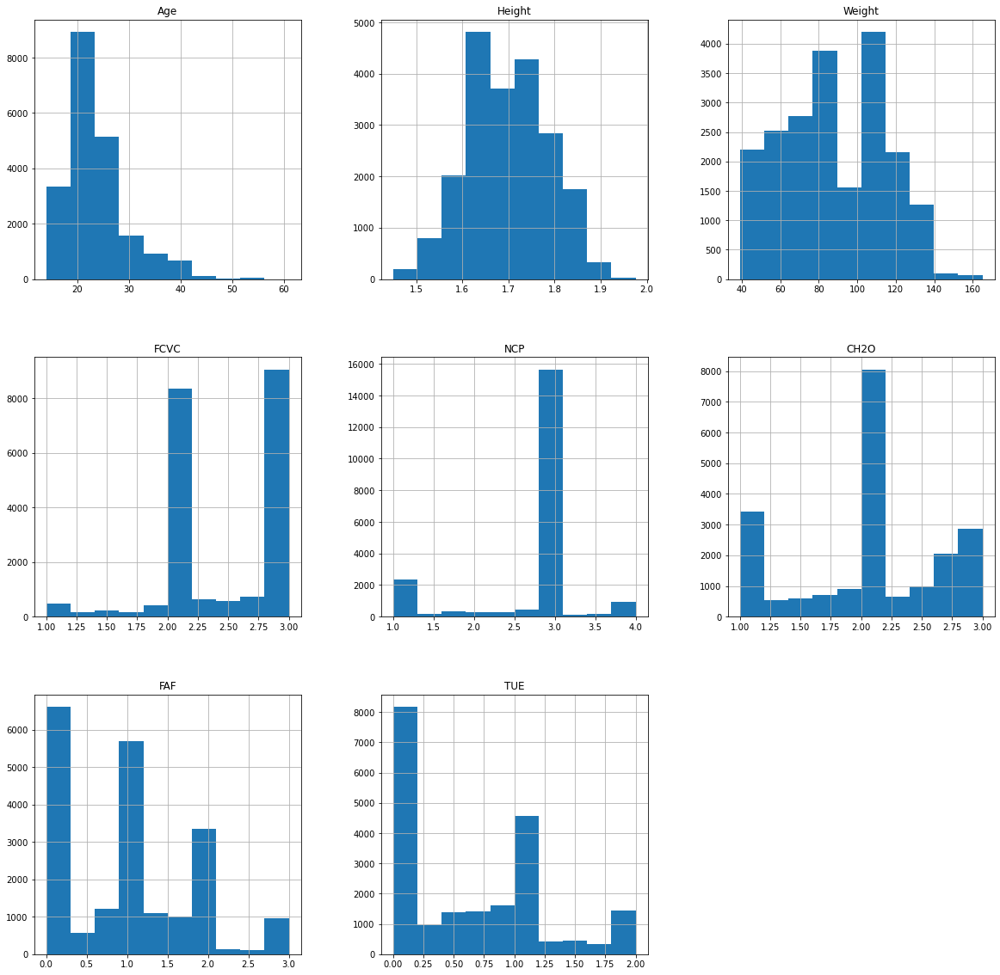

In [26]:
data.hist(figsize = (20,20))

Insights from the histograms:

1)Age: The majority of individuals in the dataset fall within the age group of 20–30, with fewer individuals above 50.

2)Height: Most individuals have a height between 1.6m and 1.75m, showing a normal distribution centered around the average height.

3)Weight: The distribution of weight is bimodal, with two peaks, indicating that there may be distinct groups with different weight ranges.

4)FCVC (Vegetable consumption): Most individuals consume vegetables between 2 to 3 times a day, which may correlate with healthier dietary habits.

5)NCP (Main meals per day): There’s a noticeable peak at 3 meals per day, suggesting a typical meal pattern for most individuals.

6)CH2O (Water consumption): Water consumption is also clustered around 2 to 2.5 liters, which indicates a general adherence to recommended hydration levels.

7)FAF (Physical activity frequency): There's a peak at 0 and 1, meaning a significant portion of individuals do very little or moderate physical activity.

8)TUE (Technology use): Many individuals use technology for less than 0.75 hours a day, with fewer using it for more than 1.5 hours.

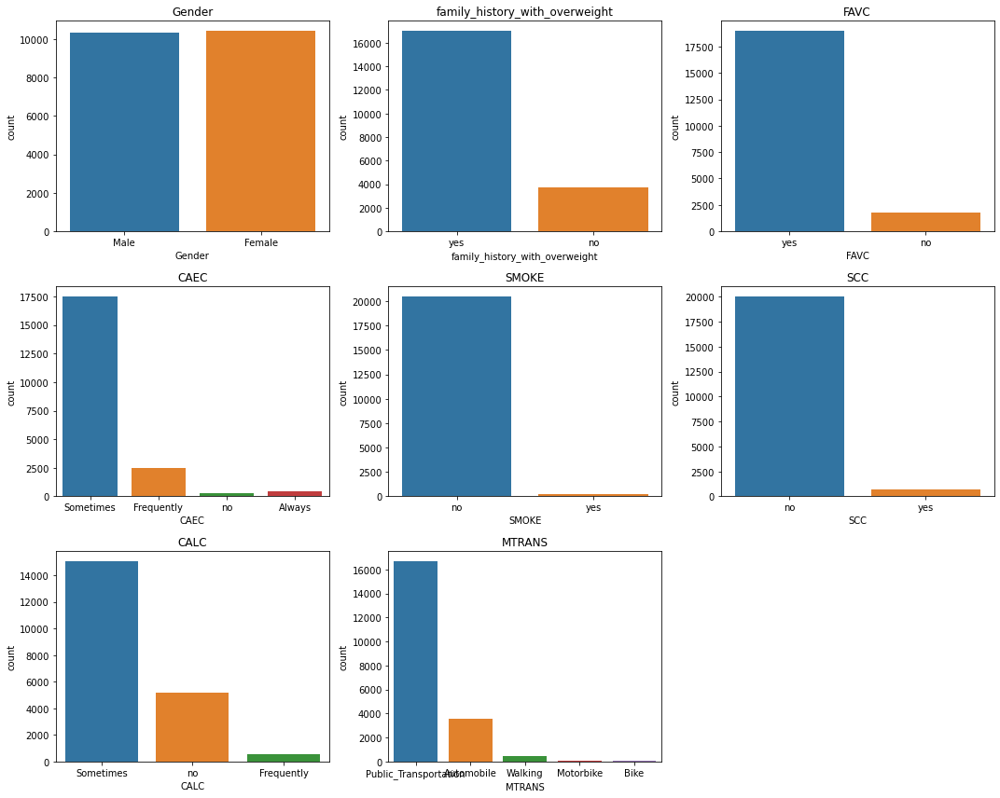

In [27]:
categorical_columns = ['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS']
plt.figure(figsize=(15, 12))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(3, 3, i)
    sns.countplot(data=data, x=col)
    plt.title(col)

plt.tight_layout()
plt.show()

There are no balance between categories in the same feature.

The majority of people consume large quantities of food that are high in calories (FAVC).

Most individuals consume food between meals (CAEC) sometimes.

We observe a significant difference in the prevalence of smoking among individuals, with varying proportions of smokers and non-smokers. The same pattern is noted for the SCC (Self-Care Commitment) feature.

Most individuals consume alcoholic beverages (CALC) sometimes.

As the vast majority of individuals opt for public transportation as their primary mode of commuting, we will delve deeper into the MTRANS feature by examining the distribution of weight classifications.

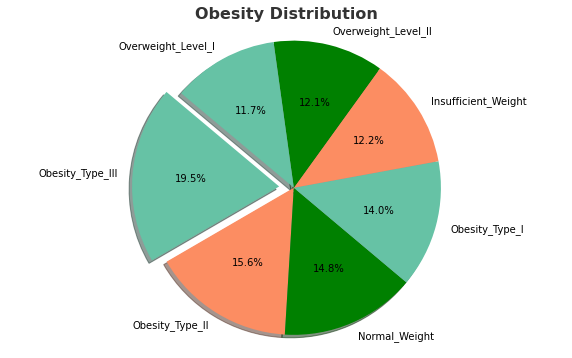

In [28]:
potability_counts = data['NObeyesdad'].value_counts()

colors = ['#66c2a5', '#fc8d62', 'green']

explode = [0.1] + [0] * (len(potability_counts) - 1)

# Plot the pie chart
plt.figure(figsize=(10, 6))
plt.pie(potability_counts, labels=potability_counts.index, autopct='%1.1f%%', startangle=140, 
        colors=colors, explode=explode, shadow=True)
plt.title('Obesity Distribution', fontsize=16, fontweight='bold', color='#333333')
plt.axis('equal')  # Equal aspect ratio ensures the pie is drawn as a circle
plt.show()

In [29]:
data["NObeyesdad"].value_counts().reset_index(name="Total")
fig=px.pie(data["NObeyesdad"].value_counts().reset_index(name="Total"),values="Total",names='index',hole=.6,template="plotly_dark",title="NObeyesdad")

fig.update_traces(hoverinfo='label+percent', textinfo='label+percent', textfont_size=20)
fig.show()


In [30]:
fig=px.pie(data["Gender"].value_counts().reset_index(name="Total"),values="Total",names='index',hole=.6,template="seaborn",title="Gender")

fig.update_traces(hoverinfo='label+percent', textinfo='value+label+percent', textfont_size=20)
fig.show()

In [31]:
#we can observe the relationship between Height (y-axis) and Weight (x-axis) based on different categories of obesity levels,
#as represented by the color-coded legend

fig = px.scatter(data, x="Weight", y="Height", color="NObeyesdad")
fig.show()


Normal Weight and Insufficient Weight:
These categories (green and red dots) tend to be clustered around lower weights (40-70 kg) and heights ranging from 1.5 to 1.75 meters.

Overweight Levels:
Overweight Level I & II (orange and light blue) tend to have a higher spread in both height and weight, generally between 70-120 kg and heights between 1.5 to 1.9 meters.

Obesity Types I to III:
Obesity Type I, II, and III (purple, pink, and dark blue) appear at much higher weights, from 80 kg to over 140 kg, with varying heights. These individuals with higher obesity levels tend to have weights well above 100 kg.

Height Distribution:
People with higher weights tend to have a wider height distribution, though most individuals are between 1.5 to 1.9 meters tall.

In [32]:
data["family_history_with_overweight"].value_counts().reset_index(name="Total")
fig=px.pie(data["family_history_with_overweight"].value_counts().reset_index(name="Total"),values="Total",names='index',hole=.6,template="plotly_dark",title="NObeyesdad")

fig.update_traces(hoverinfo='label+percent', textinfo='label+percent', textfont_size=20)
fig.show()

In [33]:
cols=['FAVC',
 'CAEC',
 'SMOKE',
 'SCC',
 'CALC',
 'MTRANS']

for i in range(len(cols)):
    data[str(cols[i])].value_counts().reset_index(name="Total")
    fig=px.pie(data[str(cols[i])].value_counts().reset_index(name="Total"),values="Total",names='index',hole=.6,template="plotly_dark",title=str(cols[i]))

    fig.update_traces(hoverinfo='label+percent', textinfo='label+percent', textfont_size=20)
    fig.show()

In [34]:
df_grouped = data.groupby("FAVC")["Gender"].value_counts().reset_index(name="Total")

fig = px.bar(df_grouped, 
             x="Gender", 
             y="Total", 
             color="FAVC", 
             barmode='group', 
             title='Gender Distribution by FAVC')

# Show the plot
fig.show()

In [35]:
df_grouped = data.groupby("CAEC")["Gender"].value_counts().reset_index(name="Total")

fig = px.bar(df_grouped, 
             x="Gender", 
             y="Total", 
             color="CAEC", 
             barmode='group', 
             title='Gender Distribution by CAEC')

# Show the plot
fig.show()

In [36]:
df_grouped = data.groupby("CALC")["Gender"].value_counts().reset_index(name="Total")

fig = px.bar(df_grouped, 
             x="Gender", 
             y="Total", 
             color="CALC", 
             barmode='group', 
             title='Gender Distribution by CALC')

# Show the plot
fig.show()

In [37]:
fig = px.scatter(data, x="Height", y="Weight",   # hover tooltips
                 title="The relationship between height and weight", 
                 trendline="ols")  # Add a trendline to observe linear relationship

# Show the plot
fig.show()

Insights from the graph:- 

There seems to be a positive correlation between height and weight,The upward trend in the data points suggests that taller individuals tend to weigh more, on average.

 The scatter plot shows a wide dispersion of points, indicating a significant variability in weight for individuals of the same height. For example, at a height of around 1.7 meters, the weight ranges from approximately 60 kg to over 120 kg.
 
 There are some points that appear far from the general trend, which could indicate outliers—either individuals with an unusually high or low weight for their height or potential anomalies in the data.
 
 The graph includes a line of best fit further emphasizing the positive relationship between height and weight.

In [38]:
fig = px.scatter(data, x="Age", y="Weight", 
                 title="The relationship between Age and weight", 
                 trendline="ols") 
fig.show()

In [39]:
grouped_df = data.groupby("Gender")["NObeyesdad"].value_counts().reset_index(name="Count")

fig = px.bar(grouped_df, 
             x="Gender", 
             y="Count", 
             color="NObeyesdad", 
             barmode="group", 
             title="Count of Obesity Levels by Gender")
fig.show()


In [40]:
data.corr()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
Age,1.000000,-0.011713,0.283381,0.034414,-0.048479,-0.016325,-0.192259,-0.296154
Height,-0.011713,1.000000,0.416677,-0.071546,0.191383,0.183706,0.295278,0.076433
Weight,0.283381,0.416677,1.000000,0.245682,0.095947,0.317914,-0.084845,-0.086471
FCVC,0.034414,-0.071546,0.245682,1.000000,0.113349,0.101299,-0.089822,-0.147843
NCP,-0.048479,0.191383,0.095947,0.113349,1.000000,0.080949,0.100871,0.067459
CH2O,-0.016325,0.183706,0.317914,0.101299,0.080949,1.000000,0.082932,-0.010654
FAF,-0.192259,0.295278,-0.084845,-0.089822,0.100871,0.082932,1.000000,0.021213
TUE,-0.296154,0.076433,-0.086471,-0.147843,0.067459,-0.010654,0.021213,1.000000


1.Age vs Weight (Correlation: 0.2646):
There is a moderate positive correlation between Age and Weight, indicating that as age increases, weight tends to increase as well. 

2.Height vs Weight (Correlation: 0.4167):
Taller individuals tend to weigh more, showing a strong correlation between height and weight.

3.FCVC vs Weight (0.2457): 
Frequent vegetable consumption shows a moderate positive correlation with weight, possibly due to dietary adjustments.

4.NCP vs Weight (0.0959): 
The number of main meals has a weak influence on weight, suggesting limited direct impact on obesity.

5.CH2O vs Weight (0.3179):
Higher water consumption is moderately associated with increased weight, possibly reflecting hydration levels.

6.FAF vs Age (-0.1908): 
Older individuals engage less in physical activity, contributing to increased obesity risk.

7.TUE vs Age (-0.2979): 
Younger individuals spend more time using technology, which may lead to a more sedentary lifestyle and higher obesity risk.

8.Height vs FAF (0.2953):
Taller individuals tend to engage in more physical activity, potentially reducing their obesity risk.

9.Weight vs FAF (-0.0848): 
Heavier individuals tend to engage slightly less in physical activity, though the correlation is weak.

10.FCVC vs FAF (-0.0898):
Vegetable consumption and physical activity are weakly negatively correlated, indicating limited alignment between diet and exercise.

Most of the correlations, such as between the number of meals (NCP) and weight, or food consumption (FCVC) and physical activity (FAF), are weak. This suggests that no single factor dominates the prediction of obesity. Multiple factors likely interact in determining risk.

The negative correlations of age with physical activity (FAF) and technology use (TUE) highlight how lifestyle changes with age, especially reduced activity, can contribute to increased obesity risk in older individuals.

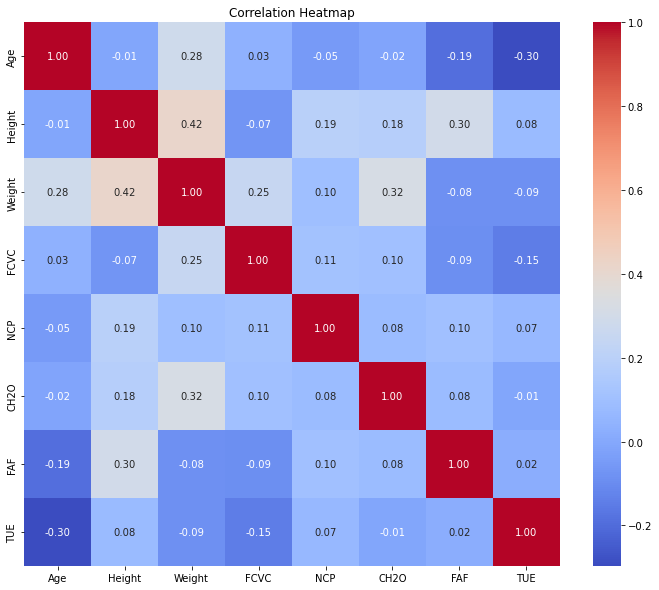

In [41]:
plt.figure(figsize=(12, 10))
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


1. Diagonal value: All diagonal values are 1.0, which makes sense because a feature is perfectly correlated with itself.
2. Weight vs Height: There is a moderate positive correlation (0.42) between weight and height, indicating that as height increases, weight tends to increase.
 
3. Age and TUE (Time spent using technology devices): A negative correlation of -0.30 indicates that older individuals might tend to spend less time using technology devices.
 
4. Height vs CH2O (Daily water consumption): The correlation between height and water consumption (0.32) suggests a positive relationship, though it's not very strong.
 
5. TUE and Age: There is a moderate negative correlation (-0.30), meaning that younger people tend to spend more time using electronic devices.
 
6. Other correlations: Most of the other correlations are fairly weak, as indicated by values close to zero.

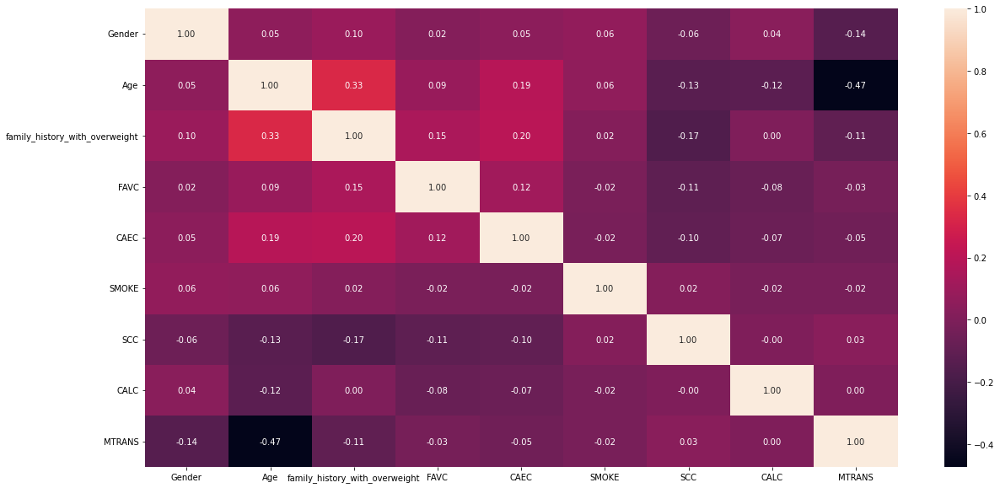

In [64]:
plt.figure(figsize = (20,10))
sns.heatmap(data[categorical_columns].corr(),annot = True,fmt=".2f")
plt.show()

In [ ]:
for col in data.columns:
    if data[col].dtype in ['int64', 'float64']:
        plt.figure(figsize=(10, 5))
        sns.boxplot(data=data, x=col)
        plt.xlabel(col)
        plt.show()

there are outliers in some features like Age & NCP

In [ ]:
data.skew()

# Using IQR

In [ ]:
numerical_columns = ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']
                            

In [43]:
def detect_outliers_iqr(data, columns, factor=1.5):
    outliers = {}
    
    for col in columns:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - factor * IQR
        upper_bound = Q3 + factor * IQR
        
        outliers[col] = data[(data[col] < lower_bound) | (data[col] > upper_bound)][col].values
    
    return outliers

# Assuming 'data' is your DataFrame and 'numerical_columns' is a list of your numerical column names
outliers_iqr = detect_outliers_iqr(data, numerical_columns)
# Display outliers
for col, outlier_values in outliers_iqr.items():
    print(f"Outliers in '{col}':")
    print(outlier_values)
    print(f"Number of outliers: {len(outlier_values)}")
    print("\n")

NameError: name 'numerical_columns' is not defined

Insights:

1)Age:

1074 outliers detected.
The outliers include both younger (e.g., 35.389491) and older (e.g., 55.272573) ages.
This suggests a wide age range in dataset, with a concentrated middle range.

2)Height:

4 outliers detected, all at 1.975663 meters (about 6'5").
This confirms what we saw earlier with the z-score method.


3)Weight:

No outliers detected.
This is surprising and might indicate a wide range of weights in dataset.


4)FCVC (Frequency of consumption of vegetables):

No outliers detected


5)NCP (Number of main meals):

6052 outliers detected
This is a very large number of outliers, suggesting high variability in this feature.
The values range from as low as 1.411685 to as high as 4.


6)CH2O (Consumption of water daily):

No outliers detected.


7)FAF (Physical activity frequency):

No outliers detected.


8)TUE (Time using technology devices):

No outliers detected.

In [ ]:
def visualize_distribution(data, column):
    plt.figure(figsize=(12, 6))
    
    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    
    # Box plot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=data[column])
    plt.title(f'Box Plot of {column}')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print(f"\nSummary Statistics for {column}:")
    print(data[column].describe())
    # Print percentiles
    print("\nPercentiles:")
    for i in range(0, 101, 5):
        print(f"{i}th percentile: {data[column].quantile(i/100):.2f}")

# Visualize Age and NCP
for column in ['Age', 'NCP']:
    visualize_distribution(data, column)

# Investigate relationship between Age and NCP
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='NCP', data=data)
plt.title('Age vs NCP')
plt.show()

In [ ]:
# Check for any correlation between Age and NCP
correlation = data['Age'].corr(data['NCP'])
print(f"\nCorrelation between Age and NCP: {correlation:.2f}")

# Investigate potential data entry errors or misinterpretation
print("\nUnique values in NCP:")
print(sorted(data['NCP'].unique()))

print("\nValue counts for NCP:")
print(data['NCP'].value_counts().sort_index())

1.Age:

Distribution: The age distribution appears to be right-skewed, with most values concentrated between 20-30 years.
Range: 14.00 to 61.00 years
Median (50th percentile): 22.82 years
Outliers: There are some older individuals (above 40 years) that appear as outliers in the box plot.


    
2.NCP (Number of main meals):

Distribution: Highly concentrated around 3 meals per day, with a large spike at this value.
Range: The unique values seem to be between 1 and 4, based on the box plot.
Median (50th percentile): 3.00
Outliers: Values below 2 and above 3 appear as outliers in the box plot.

In [ ]:
# Define bins and labels for categorizing age groups
age_bins = [0, 12, 19, 35, 60, 100]  # Age range from 0 to 100
age_labels = ['Child', 'Teen', 'Young Adult', 'Middle-Aged Adult', 'Senior']
 
# Convert the 'Age' column to categorical using the bins and labels
data['Age'] = pd.cut(data['Age'], bins=age_bins, labels=age_labels, right=False)

In [ ]:
data['Age'].value_counts()

In [ ]:
data.head()

In [ ]:
# Define bins and labels for categorizing age groups
age_bins = [0, 12, 19, 35, 60, 100]  # Age range from 0 to 100
age_labels = ['Child', 'Teen', 'Young Adult', 'Middle-Aged Adult', 'Senior']
 
# Convert the 'Age' column to categorical using the bins and labels
test_data['Age'] = pd.cut(test_data['Age'], bins=age_bins, labels=age_labels, right=False)

In [ ]:
test_data.head()

# Check Class Imbalance in the Target Variable

In [ ]:
# Check class distribution for the target variable 'NObeyesdad'
class_distribution = data['NObeyesdad'].value_counts(normalize=True)

# Visualize the class distribution
class_distribution.plot(kind='bar', color='skyblue')
plt.xlabel('Class')
plt.ylabel('Proportion')
plt.title('Class Distribution in Target Variable')
plt.xticks(rotation=45)
plt.show()


There are 7 classes in total, representing different obesity levels or weight categories. The classes seem to be relatively evenly distributed, with proportions ranging approximately from 0.10 to 0.20.

In [ ]:
# List of categorical features
categorical_features = ['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE', 'CALC', 'MTRANS']

# Visualize the class distribution for each categorical feature
for col in categorical_features:
    distribution = data[col].value_counts(normalize=True)
    distribution.plot(kind='bar', color='lightcoral')
    plt.xlabel(f'{col}')
    plt.ylabel('Proportion')
    plt.title(f'Class Distribution in {col}')
    plt.xticks(rotation=45)
    plt.show()


# Label Encoding 

For Training data 

In [44]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()
lb

LabelEncoder()

In [45]:
data['Gender'] = lb.fit_transform(data['Gender'])
data['Age'] = lb.fit_transform(data['Age'])
data['family_history_with_overweight'] = lb.fit_transform(data['family_history_with_overweight'])
data['FAVC'] = lb.fit_transform(data['FAVC'])
data['CAEC'] = lb.fit_transform(data['CAEC'])
data['SMOKE'] = lb.fit_transform(data['SMOKE'])
data['SCC'] = lb.fit_transform(data['SCC'])
data['CALC'] = lb.fit_transform(data['CALC'])
data['MTRANS'] = lb.fit_transform(data['MTRANS'])
data['NObeyesdad'] = lb.fit_transform(data['NObeyesdad'])

In [ ]:
data.head()

In [ ]:
data.corr()

In [ ]:
plt.figure(figsize=(12, 10))
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


For Test Data

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
lb = LabelEncoder()


# For test data
for column in categorical_columns:
    test_data[column] = lb.fit_transform(test_data[column])

In [ ]:
test_data.head()

In [ ]:
data['Age'].value_counts()

# Feature Engineering

Body Mass Index

In [46]:
# For training data
data['BMI'] = data['Weight'] / (data['Height'] ** 2)

# For test data
test_data['BMI'] = test_data['Weight'] / (test_data['Height'] ** 2)

In [ ]:
data.head()

In [ ]:
test_data.head()

# Feature Scaling 

In [47]:
# Features and target
X = data.drop(['NObeyesdad'], axis=1)  
y = data['NObeyesdad']



In [49]:
# Split into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("\nTraining Features:\n", X_train)
print("\nTraining Target:\n", y_train)


Training Features:
        Gender   Age    Height      Weight  family_history_with_overweight  \
9958        1    27  1.770000   97.000000                               1   
7841        1   734  1.753389   54.877111                               1   
9293        1   637  1.819867  122.024954                               1   
15209       0  1656  1.580000   80.000000                               1   
16515       1   818  1.800000   95.000000                               1   
...       ...   ...       ...         ...                             ...   
11284       0    92  1.722461   80.442775                               1   
11964       1   671  1.750000   95.000000                               1   
5390        1   462  1.620000   68.000000                               0   
860         0  1152  1.650125  111.939671                               1   
15795       1  1574  1.774330  107.998815                               1   

       FAVC      FCVC       NCP  CAEC  SMOKE      CH2O

In [50]:
from sklearn.preprocessing import MinMaxScaler

In [51]:
# Fit the scaler on the training data and transform both training and testing data
scaler = MinMaxScaler()

# Fitting the scaler on the training data and transforming both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


# Convert scaled data back to DataFrame for readability
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns, index=X_test.index)


In [ ]:
X_train_scaled

In [ ]:
X_train_scaled.shape   #80% training and 20% testing.

In [ ]:
X_test_scaled.shape

# Model Building 

In [ ]:
from sklearn.linear_model import LogisticRegression 

clf_model=LogisticRegression()
clf_model.fit(X_train_scaled,y_train) 

In [ ]:
y_pred_clf=clf_model.predict(X_test)
y_pred_clf

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

y_train_pred = clf_model.predict(X_train_scaled)

# Calculate the training accuracy
training_accuracy = accuracy_score(y_train, y_train_pred)

print(f"Training Accuracy: {training_accuracy * 100:.2f}%")

In [ ]:

accuracy = accuracy_score(y_test, y_pred_clf)  # Ensure y_test is defined
print(f"Test Accuracy: {accuracy:.4f}")

# Classification Report
print("\nClassification Report:\n", classification_report(y_test, y_pred_clf))

# Confusion Matrix
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_clf))

# Random Forest 

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the model
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_classifier.fit(X_train_scaled, y_train)



In [ ]:
# Make predictions
# Predict on the test set
y_pred = rf_classifier.predict(X_test_scaled)
y_pred

# Evalution 

In [ ]:
#Training Accuracy 

y_train_pred = rf_classifier.predict(X_train_scaled)

# Calculate the training accuracy
training_accuracy = accuracy_score(y_train, y_train_pred)

print(f"Training Accuracy: {training_accuracy * 100:.2f}%")

In [ ]:
# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"\nAccuracy: {accuracy:.2f}")

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# Hyperparameter tuning (Random Forest)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start = 200, stop = 1000, num=5)]
max_features = ['auto','sqrt'] #max number of features allowed to try in individual tree 
max_depth = [int(x) for x in np.linspace(10,110, num = 11)]
max_depth.append(None)
min_samples_split = [2,5,10]
min_samples_leaf = [1,2,4]
bootstrap = [True,False]  #sampling 


random_grid = {'n_estimators' : n_estimators,'max_features': max_features,
              'max_depth': max_depth, 'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf,'bootstrap': bootstrap}
rf_classifier = RandomForestClassifier(random_state=42)

rf_cv = RandomizedSearchCV(estimator=rf_classifier, scoring='f1', param_distributions=random_grid,n_iter=20, cv=3, verbose=2,
                          random_state=42, n_jobs=3)

rf_cv.fit(X_train_scaled,y_train)
rf_best_params = rf_cv.best_params_
print(f"Best Parameters: {rf_best_params}")

In [ ]:
rf_clf2 = RandomForestClassifier(**rf_best_params)   #** imp 

rf_clf2.fit(X_train_scaled,y_train)

y_predict = rf_clf2.predict(X_test)

In [ ]:
print(classification_report(y_test,y_predict))

# XG BOOST 

In [52]:
from xgboost import XGBClassifier

# Initialize the XGBoost classifier with default parameters
xgb = XGBClassifier(random_state=42)

# Fit the model to the training data
xgb.fit(X_train_scaled, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

                           Feature  Importance
0                           Gender    0.324465
16                             BMI    0.289493
3                           Weight    0.117592
5                             FAVC    0.040982
10                            CH2O    0.025101
14                            CALC    0.023874
11                             SCC    0.022352
6                             FCVC    0.020015
1                              Age    0.018439
4   family_history_with_overweight    0.018322
15                          MTRANS    0.018084
7                              NCP    0.017990
8                             CAEC    0.016028
13                             TUE    0.014262
2                           Height    0.013263
12                             FAF    0.012324
9                            SMOKE    0.007415


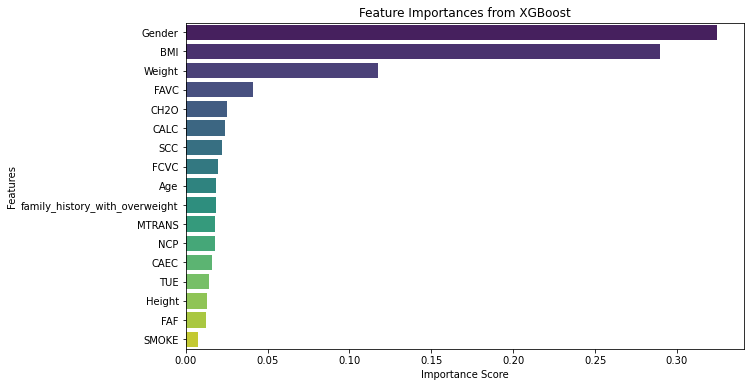

In [53]:
# Get feature importances
importances = xgb.feature_importances_

# Create a DataFrame for visualization
feature_importances = pd.DataFrame({
    'Feature': X_train_scaled.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print(feature_importances)

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importances, palette='viridis')
plt.title('Feature Importances from XGBoost')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

In [54]:
# Set a threshold for feature importance
importance_threshold = 0.010# Adjust as needed

# Select features above the threshold
significant_features = feature_importances[feature_importances['Importance'] > importance_threshold]['Feature'].tolist()
print("Significant Features:", significant_features)

# Final dataset with significant features
X_significant = X_train_scaled[significant_features]


Significant Features: ['Gender', 'BMI', 'Weight', 'FAVC', 'CH2O', 'CALC', 'SCC', 'FCVC', 'Age', 'family_history_with_overweight', 'MTRANS', 'NCP', 'CAEC', 'TUE', 'Height', 'FAF']


In [55]:
# Select significant features in training and testing sets
X_train_significant = X_train_scaled[significant_features]
X_test_significant = X_test_scaled[significant_features]

print("Training Features Shape:", X_train_significant.shape)
print("Testing Features Shape:", X_test_significant.shape)

Training Features Shape: (16606, 16)
Testing Features Shape: (4152, 16)


In [56]:
from xgboost import XGBClassifier

# Initialize the model
xgb_clf = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Train the model
xgb_clf.fit(X_train_significant, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

In [57]:
# Predictions
y_train_pred =xgb_clf.predict(X_train_significant)
y_test_pred =xgb_clf.predict(X_test_significant)

In [59]:
# Training Accuracy
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")
    
    # Testing Accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Testing Accuracy: {test_accuracy * 100:.2f}%")
    
    # Confusion Matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))
    
    # Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_test_pred))

Training Accuracy: 99.05%
Testing Accuracy: 90.63%

Confusion Matrix:
[[486  35   0   0   0   2   1]
 [ 28 552   0   0   1  41   4]
 [  2   2 480  11   1  12  35]
 [  0   0  12 640   3   0   2]
 [  0   0   0   1 802   1   0]
 [  1  31  13   0   0 386  53]
 [  0  10  38   3   0  46 417]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.93      0.93       524
           1       0.88      0.88      0.88       626
           2       0.88      0.88      0.88       543
           3       0.98      0.97      0.98       657
           4       0.99      1.00      1.00       804
           5       0.79      0.80      0.79       484
           6       0.81      0.81      0.81       514

    accuracy                           0.91      4152
   macro avg       0.90      0.90      0.90      4152
weighted avg       0.91      0.91      0.91      4152



# Hyperparameter XGB

In [ ]:
from xgboost import XGBClassifier

xgb = XGBClassifier(
    random_state=42,
    n_estimators=100,
    max_depth=10,              # Reduced from 20 to prevent overfitting
    min_child_weight=1,        # Equivalent to min_samples_split/min_samples_leaf
    gamma=0,                   # Adjust as needed
    subsample=0.8,             # 80% of samples
    colsample_bytree=0.8,      # 80% of features
    learning_rate=0.1,         # Commonly used learning rate
    use_label_encoder=False,   # To avoid warnings in newer versions
    eval_metric='logloss'      # Specify evaluation metric
)
xgb.fit(X_train_scaled, y_train)



In [ ]:
y_pred = xgb.predict(X_test_scaled)
y_pred

In [ ]:
y_train_pred = xgb.predict(X_train_scaled)

# Calculate the training accuracy
training_accuracy = accuracy_score(y_train, y_train_pred)

print(f"Training Accuracy: {training_accuracy * 100:.2f}%")

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Classification Report:', classification_report(y_test, y_pred))
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))

# SVM 

Scaling: It's essential to scale your data before using SVM since it is sensitive to feature scaling.

In [ ]:
from sklearn.svm import SVC

# Initialize the SVC classifier with default parameters
svm = SVC()

# Fit the model to the training data
svm.fit(X_train_scaled, y_train)



In [ ]:
# Make predictions on the test data
y_pred = svm.predict(X_test_scaled)
y_pred

In [ ]:
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Classification Report:', classification_report(y_test, y_pred))
print('Confusion Matrix:', confusion_matrix(y_test, y_pred))

# Hyperparameter for SVM 

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_grid = {
    'C': [0.1, 1, 10, 100, 1000],  # Regularization parameter
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],  # Kernel types
    'gamma': ['scale', 'auto'],  # Kernel coefficient
    'degree': [2, 3, 4],  # Only applicable for 'poly' kernel
    'coef0': [0.0, 0.1, 0.5, 1],  # Only for 'poly' and 'sigmoid'
}

# Initialize the SVM classifier
svc = SVC(random_state=42)

# Set up RandomizedSearchCV
svc_cv = RandomizedSearchCV(estimator=svc, param_distributions=param_grid, 
                            scoring='accuracy', n_iter=20, cv=3, verbose=2, random_state=42, n_jobs=-1)

# Fit the model
svc_cv.fit(X_train_scaled, y_train)

# Get the best parameters
best_params = svc_cv.best_params_
print(f"Best Parameters: {best_params}")

In [ ]:
# Initialize the SVC model with the best parameters
best_svc = SVC(**best_params, random_state=42)

# Train the SVM model on the scaled training data
best_svc.fit(X_train_scaled, y_train)

In [ ]:
y_pred = best_svc.predict(X_test_scaled)

# Evaluate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy on the test set: {accuracy:.2f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix:\n{cm}")

# Classification Report
report = classification_report(y_test, y_pred)
print(f"Classification Report:\n{report}")

# Decision Tree 

In [65]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV

In [66]:
dt_classifier = DecisionTreeClassifier(random_state=42)

# Fit the model to the training data
dt_classifier.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = dt_classifier.predict(X_test_scaled)

# Evaluate the model using accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

Accuracy: 0.8408


# Hyperparameter Tuining for Decision Tree

In [ ]:
# Define the hyperparameter grid for RandomizedSearchCV
param_grid = {
    'criterion': ['gini', 'entropy'],  # Splitting criteria
    'max_depth': [None, 10, 20, 30, 40],  # Maximum depth of the tree
    'min_samples_split': [2, 10, 20],  # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 5, 10],  # Minimum samples required to be at a leaf node
    'max_features': [None, 'sqrt', 'log2'],  # Number of features to consider for the best split
    'splitter': ['best', 'random']  # Strategy used to split at each node
}

# Initialize the Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=42)

# Set up RandomizedSearchCV
dt_cv = RandomizedSearchCV(estimator=dt_classifier, param_distributions=param_grid, 
                           scoring='accuracy', n_iter=20, cv=3, verbose=2, random_state=42, n_jobs=-1)

# Fit the model
dt_cv.fit(X_train_scaled, y_train)

# Get the best parameters
best_params = dt_cv.best_params_
print(f"Best Parameters: {best_params}")


In [ ]:
best_dt = DecisionTreeClassifier(**best_params, random_state=42)
best_dt.fit(X_train_scaled, y_train)

In [ ]:
# Make predictions on the test data
y_pred = best_dt.predict(X_test_scaled)

# Evaluate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy on the test set: {accuracy:.2f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix:\n{cm}")

# Classification Report
report = classification_report(y_test, y_pred)
print(f"Classification Report:\n{report}")


# Gradient Desent 

In [60]:
from sklearn.ensemble import GradientBoostingClassifier

In [61]:
# Initialize the Gradient Boosting classifier with default parameters
gb_classifier = GradientBoostingClassifier(random_state=42)

# Fit the model to the training data
gb_classifier.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = gb_classifier.predict(X_test_scaled)

# Evaluate the model using accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

Accuracy: 0.9022


In [62]:
y_train_pred = gb_classifier.predict(X_train_scaled)

# Calculate the training accuracy
training_accuracy = accuracy_score(y_train, y_train_pred)

print(f"Training Accuracy: {training_accuracy * 100:.2f}%")

Training Accuracy: 92.15%


# KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
# Initialize the KNN classifier
knn = KNeighborsClassifier(n_neighbors=3)  # You can adjust n_neighbors based on your needs

# Fit the model
knn.fit(X_train_scaled, y_train)

# Make predictions
y_pred = knn.predict(X_test_scaled)

# Evaluate the model
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# LGBM Classifier 

In [ ]:
!pip install lightgbm

from lightgbm import LGBMClassifier

params = {"objective": "multiclass",          
    "metric": "multi_logloss",          
    "verbosity": -1,                    
    "boosting_type": "gbdt",            
    "random_state": 42,       
    "num_class": 7,                     
    'learning_rate': 0.030962211546832760,  
    'n_estimators': 500,                
    'lambda_l1': 0.009667446568254372,  
    'lambda_l2': 0.04018641437301800,   
    'max_depth': 10,                    
    'colsample_bytree': 0.40977129346872643,  
    'subsample': 0.9535797422450176,   
    'min_child_samples': 26,
    'class_weight':'balanced'
    }

In [ ]:
lgbm_classifier = LGBMClassifier(**params)

lgbm_classifier.fit(X_train_scaled, y_train)

y_pred = lgbm_classifier.predict(X_test_scaled)


accuracy_score(y_test, y_pred)

# ANN 

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers


In [ ]:
num_classes = len(np.unique(y_train))


In [ ]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers

# Assuming X_train_scaled is your feature matrix and y_train is your label-encoded target variable.

# Determine the number of classes from the label-encoded y_train
num_classes = len(np.unique(y_train))

# Define the ANN model
model = keras.Sequential()
model.add(layers.Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],)))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(num_classes, activation='softmax'))  # Use softmax for multi-class classification

# Compile the model using sparse categorical crossentropy
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, validation_split=0.2)


In [ ]:
# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test)
print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Predictions
predictions = model.predict(X_test_scaled)
predicted_classes = np.argmax(predictions, axis=1)